In [ ]:
#|hide
## Standard libraries
import os
import math
import numpy as np
import time
from nbdev.showdoc import *
# Configure environment
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE']='false' # Tells Jax not to hog all of the memory to this process.

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.colors import to_rgba
import seaborn as sns
sns.set()

## Progress bar
from tqdm.notebook import tqdm, trange

## project specifics
import diffusion_curvature
from diffusion_curvature.datasets import *
from diffusion_curvature.graphs import *
from diffusion_curvature.core import *
from diffusion_curvature.utils import *
import jax
import jax.numpy as jnp
print(jax.devices())

# Notebook specifics
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML

%load_ext autoreload
%autoreload 2

[CpuDevice(id=0)]
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 3e1 Flattening with Diffusion Models

# Examining the impact of noising on diffusion probabilities

## With a Sphere

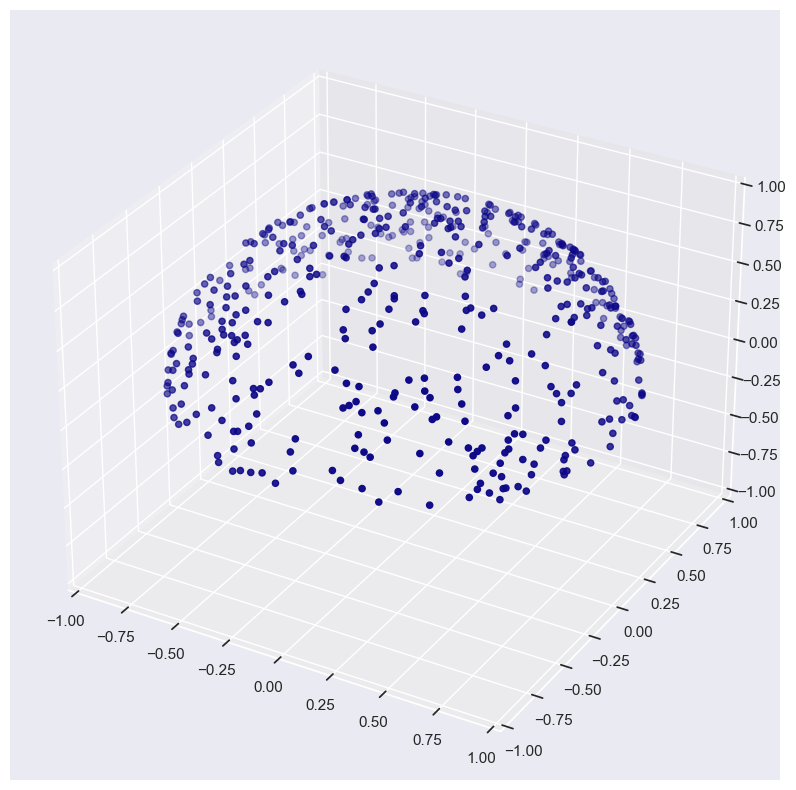

In [ ]:
X_sphere, ks_sphere = sphere(1000,use_guide_points=True) # keep it relatively sparse
X_cap_of_sphere = X_sphere[X_sphere[:,2] > 0] # Just the itty bitty polar top
X_pca = X_cap_of_sphere[:,:2]
plot_3d(X_cap_of_sphere)

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [ ]:
Lambda = 2  # @param {type:"slider", min:1, max:50, step:1}
timesteps = 50
ts = np.linspace(0, 1, timesteps)
# Generate random normal samples for the Wiener process
# dw = np.concatenate([np.zeros((len(ts),2,1)), np.random.normal(0, np.sqrt(ts[1] - ts[0]), size=(len(ts), 2, len(X_pca)-1))],axis=-1)  # Three-dimensional array for multiple trajectories
dw = np.concatenate([np.ones((len(ts),2,1)), 2*np.random.rand(len(ts), 2, len(X_pca)-1)],axis=-1)-1 # Three-dimensional array for multiple trajectories

In [ ]:
# Compute the diffusion process for multiple trajectories
x = np.cumsum((Lambda**ts - 1)[:, None, None] * dw, axis=0) + X_pca.T[None, :, :]  # Broadcasting x0 to match the shape of dw

In [ ]:
i = 4
print(x[i][0][0],x[i][1][0])

0.0 0.0


We'll now run diffusion at each point along the way, capturing the (unsigned) diffusion curvatures.

In [ ]:
common_t = 10

In [ ]:
Ps_at_ts = []
uks_at_ts = []
for t in range(timesteps):
    G_t = get_adaptive_graph(x[t].T)
    DC = DiffusionCurvature(
        laziness_method="Entropic",
        graph_former = get_adaptive_graph,
    )
    uks = DC.unsigned_curvature(G_t, t=common_t)
    Ps_at_ts.append(DC.Pt)
    uks_at_ts.append(uks[0])

2024-01-05 06:42:42,648:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,797:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,827:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,856:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,885:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,913:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,943:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:42,974:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:42:43,005:[WARNING](pygsp.graphs.graph.che

Text(0.5, 1.0, 'PCA Projection of Sphere Neighborhood')

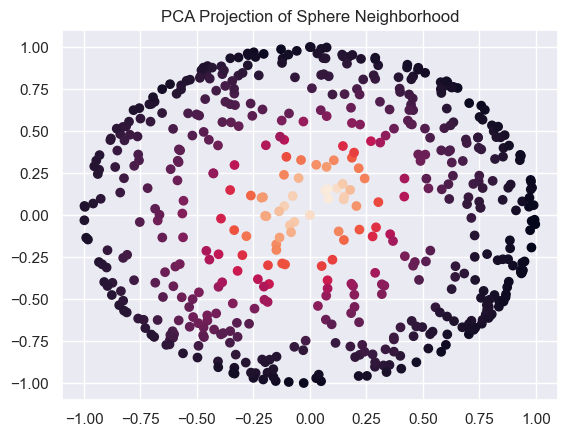

In [ ]:
plt.scatter(X_pca[:,0],X_pca[:,1],c=Ps_at_ts[0][0])
plt.title("PCA Projection of Sphere Neighborhood")

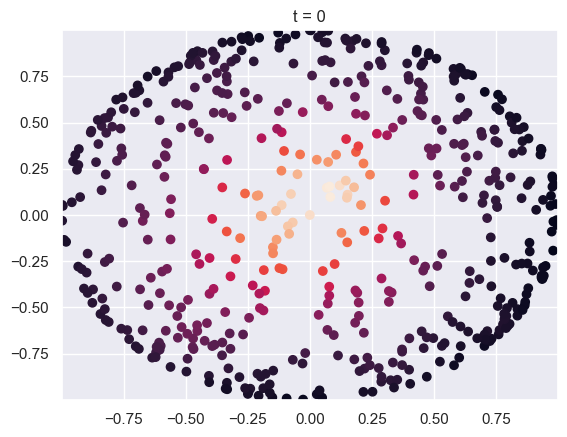

In [ ]:
# Assuming x is a numpy array of shape (50, 2, 164)
# Set up the figure and axis for the animation
fig, ax = plt.subplots()

def animate(i):
    ax.clear()
    ax.scatter(x[i, 0, :], x[i, 1, :], c = Ps_at_ts[i][0])
    max = np.max(np.abs(x[i]))
    ax.set_xlim(-max, max)
    ax.set_ylim(-max, max)
    ax.set_title(f"t = {i}")

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=50, interval=400)
HTML(ani.to_jshtml())

We'll compare the diffusion entropies of this diffusion process with the entropy of diffusion on the sphere, and on plane.

In [ ]:
G_sphere = get_adaptive_graph(X_cap_of_sphere)
DC = DiffusionCurvature(
    laziness_method="Entropic",
    flattening_method="Fixed",
    comparison_method="Subtraction",
    graph_former = get_adaptive_graph,
)
sphere_entropy = DC.unsigned_curvature(G_sphere, t=common_t)[0]
sphere_entropy

2024-01-05 06:42:52,510:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


Array(5.9258313, dtype=float32)

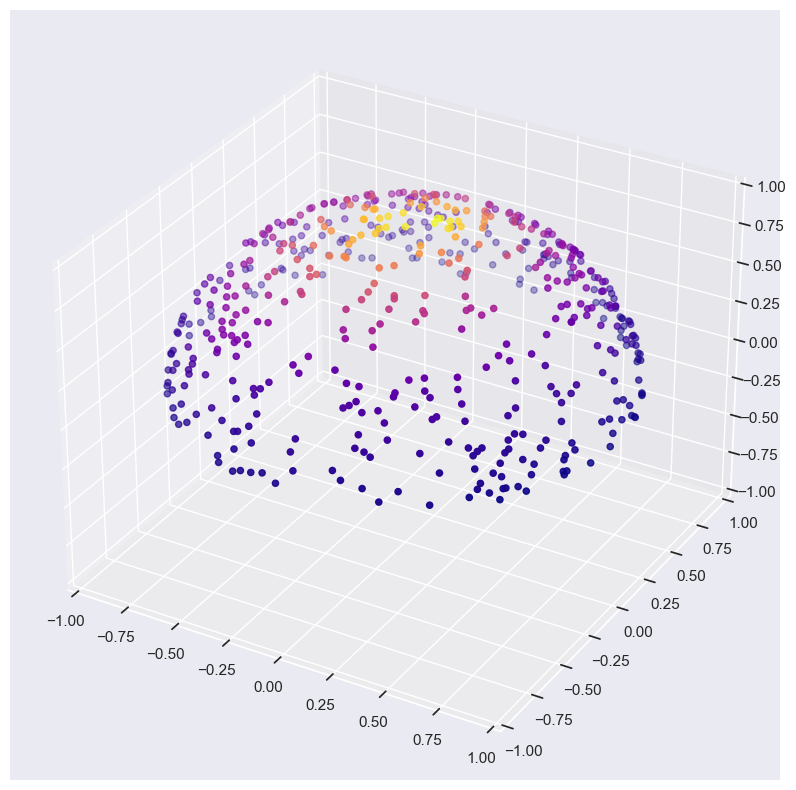

In [ ]:
plot_3d(X_cap_of_sphere,DC.Pt[0])

In [ ]:
DC.curvature(G_sphere,t=common_t,dim=2)[0]

(526,)


2024-01-05 06:42:56,590:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Array(0.15720034, dtype=float32)

In [ ]:
X_plane = plane(len(X_cap_of_sphere))
G_plane = get_adaptive_graph(X_plane)
plane_entropy = DC.unsigned_curvature(G_plane, t=common_t)[0]
plane_entropy

2024-01-05 06:43:03,565:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


Array(6.0050507, dtype=float32)

<matplotlib.collections.PathCollection>

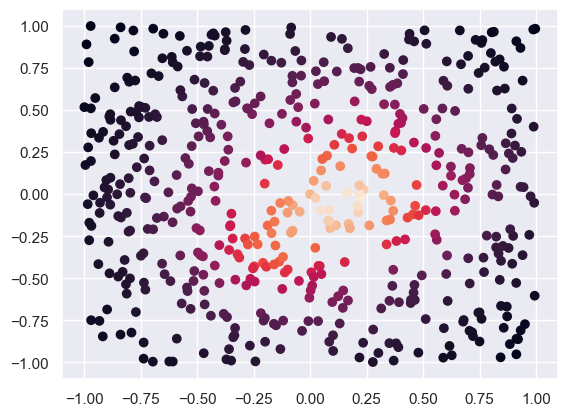

In [ ]:
plt.scatter(X_plane[:,0], X_plane[:,1], c=DC.Pt[0])

In [ ]:
# from diffusion_curvature.compute_mean_flat_entropies import average_flat_entropies
# plane_entropy = average_flat_entropies(dim=2,t=10,num_trials=100, num_points_in_comparison=len(X_pca))

In [ ]:
plane_entropy

Array(6.0050507, dtype=float32)

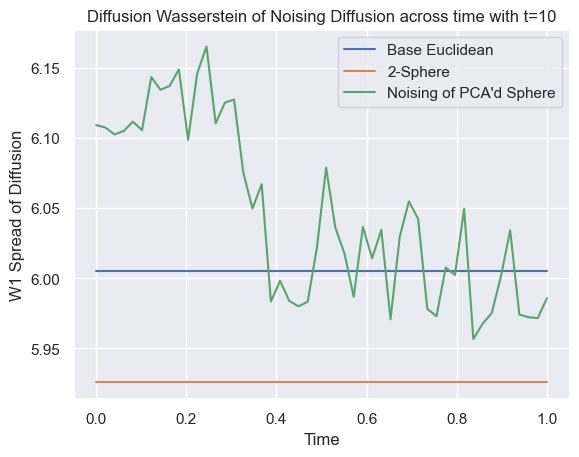

In [ ]:
plt.plot(ts, np.ones_like(uks_at_ts)*plane_entropy, label = "Base Euclidean")
plt.plot(ts, np.ones_like(uks_at_ts)*sphere_entropy, label = "2-Sphere")
plt.plot(ts, uks_at_ts, label = "Noising of PCA'd Sphere")
plt.xlabel("Time")
plt.ylabel("W1 Spread of Diffusion")
plt.title(f"Diffusion Wasserstein of Noising Diffusion across time with t={common_t}")
plt.legend()
plt.show()

## With a Saddle

In [ ]:
common_t = 10

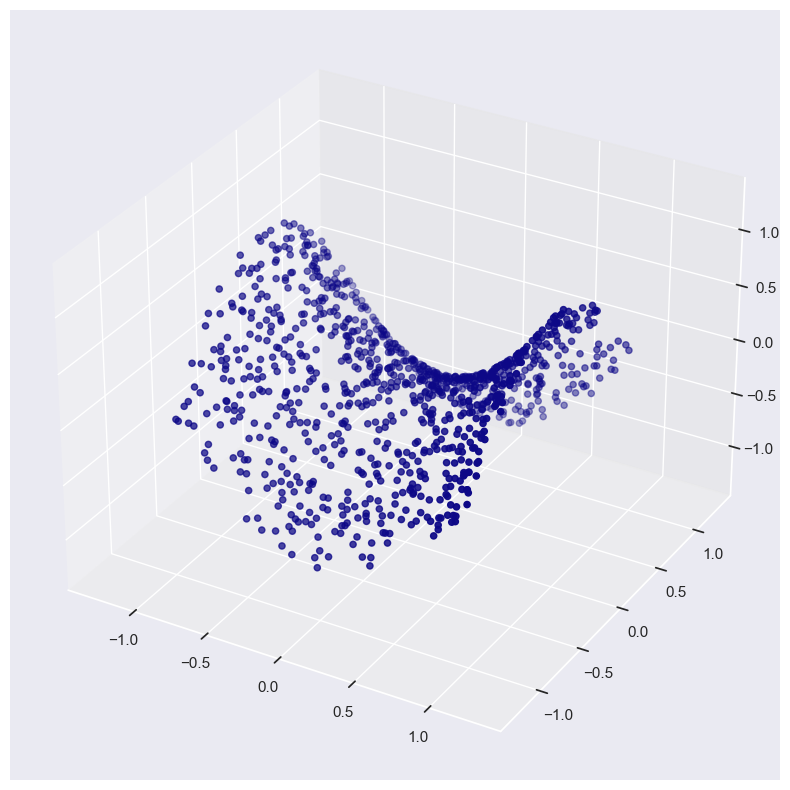

In [ ]:
X_sphere, ks_sphere = paraboloid(1000,use_guide_points=True) # keep it relatively sparse
X_cap_of_sphere = X_sphere[X_sphere[:,2] > -1] # Just the itty bitty polar top
X_pca = X_cap_of_sphere[:,:2]
plot_3d(X_cap_of_sphere)

In [ ]:
len(X_cap_of_sphere)

1000

In [ ]:
A = get_adaptive_graph(X_cap_of_sphere)

2024-01-05 06:44:02,858:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


In [ ]:
Lambda = 2  # @param {type:"slider", min:1, max:50, step:1}
timesteps = 50
ts = np.linspace(0, 1, timesteps)
# Generate random normal samples for the Wiener process
# dw = np.concatenate([np.zeros((len(ts),2,1)), np.random.normal(0, np.sqrt(ts[1] - ts[0]), size=(len(ts), 2, len(X_pca)-1))],axis=-1)  # Three-dimensional array for multiple trajectories
dw = np.concatenate([np.ones((len(ts),2,1)), 2*np.random.rand(len(ts), 2, len(X_pca)-1)],axis=-1)-1 # Three-dimensional array for multiple trajectories

In [ ]:
# Compute the diffusion process for multiple trajectories
x = np.cumsum((Lambda**ts - 1)[:, None, None] * dw, axis=0) + X_pca.T[None, :, :]  # Broadcasting x0 to match the shape of dw

In [ ]:
i = 4
print(x[i][0][0],x[i][1][0])

0.0 0.0


We'll now run diffusion at each point along the way, capturing the (unsigned) diffusion curvatures.

In [ ]:
Ps_at_ts = []
uks_at_ts = []
for t in range(timesteps):
    G_t = get_adaptive_graph(x[t].T)
    DC = DiffusionCurvature(
        laziness_method="Entropic",
        graph_former = get_adaptive_graph,
    )
    uks = DC.unsigned_curvature(G_t, t=common_t)
    Ps_at_ts.append(DC.Pt)
    uks_at_ts.append(uks[0])

2024-01-05 06:44:12,206:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:12,415:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:12,503:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:12,671:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:12,765:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:12,856:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:12,949:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:13,043:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
2024-01-05 06:44:13,140:[WARNING](pygsp.graphs.graph.che

Text(0.5, 1.0, 'PCA Projection of Sphere Neighborhood')

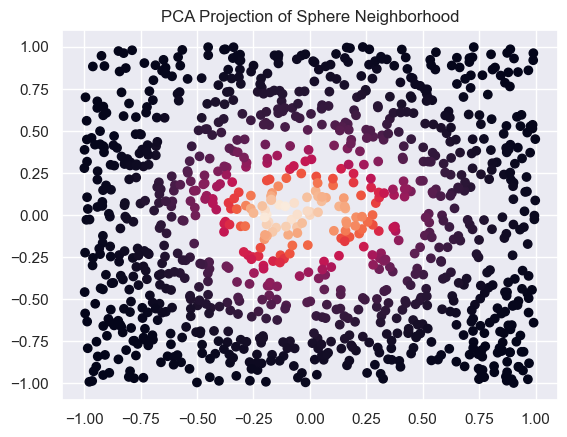

In [ ]:
plt.scatter(X_pca[:,0],X_pca[:,1],c=Ps_at_ts[0][0])
plt.title("PCA Projection of Sphere Neighborhood")

In [ ]:
from IPython.display import HTML

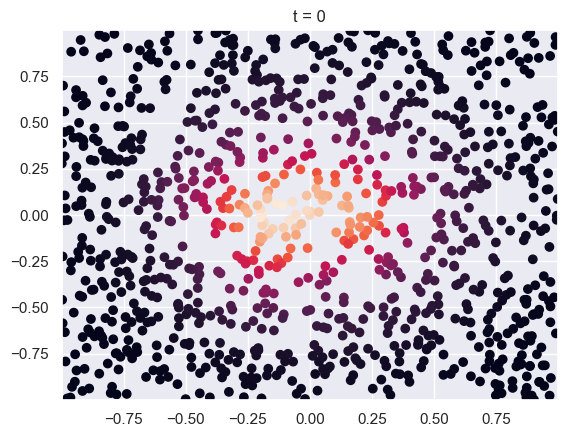

In [ ]:
# Assuming x is a numpy array of shape (50, 2, 164)
# Set up the figure and axis for the animation
fig, ax = plt.subplots()

def animate(i):
    ax.clear()
    ax.scatter(x[i, 0, :], x[i, 1, :], c = Ps_at_ts[i][0])
    max = np.max(np.abs(x[i]))
    ax.set_xlim(-max, max)
    ax.set_ylim(-max, max)
    ax.set_title(f"t = {i}")

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=50, interval=400)
HTML(ani.to_jshtml())

We'll compare the diffusion entropies of this diffusion process with the entropy of diffusion on the sphere, and on plane.

In [ ]:
G_sphere = get_adaptive_graph(X_cap_of_sphere)
DC = DiffusionCurvature(
    laziness_method="Entropic",
    flattening_method="Fixed",
    comparison_method="Subtraction",
    graph_former = get_adaptive_graph,
)
sphere_entropy = DC.unsigned_curvature(G_sphere, t=common_t)[0]
sphere_entropy

2024-01-05 06:50:26,161:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


Array(6.172902, dtype=float32)

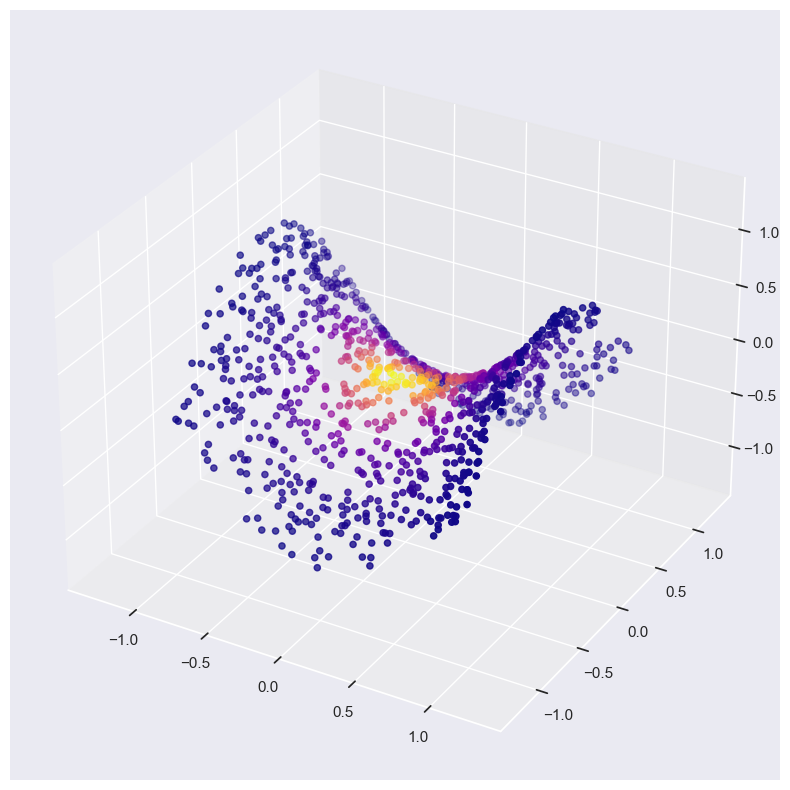

In [ ]:
plot_3d(X_cap_of_sphere,DC.Pt[0])

In [ ]:
DC.curvature(G_sphere,t=common_t,dim=2)[0]

2024-01-05 06:50:30,332:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!
IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Array(0.04980755, dtype=float32)

In [ ]:
show_doc(get_adaptive_graph)

---

### get_adaptive_graph

>      get_adaptive_graph (X, k=10, alpha=0)

In [ ]:
X_plane = plane(len(X_cap_of_sphere), dim=2)
G_plane = get_adaptive_graph(X_plane)
DC = DiffusionCurvature(
    laziness_method="Entropic",
    flattening_method="Fixed",
    comparison_method="Subtraction",
    graph_former = get_adaptive_graph,
)
plane_entropy = DC.unsigned_curvature(G_plane, t=common_t)[0]
plane_entropy

2024-01-05 06:50:07,512:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


Array(6.306818, dtype=float32)

<matplotlib.collections.PathCollection>

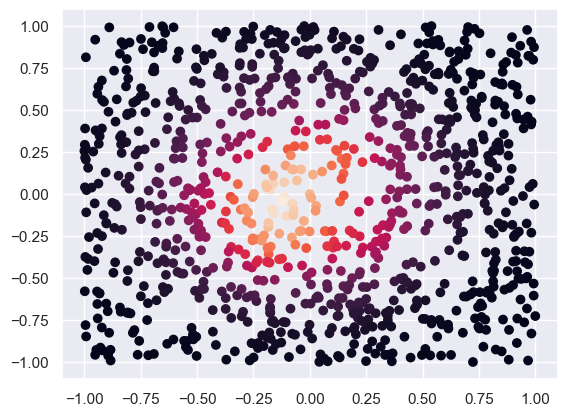

In [ ]:
plt.scatter(X_plane[:,0], X_plane[:,1], c=DC.Pt[0])

In [ ]:
# from diffusion_curvature.compute_mean_flat_entropies import average_flat_entropies
# plane_entropy = average_flat_entropies(dim=2,t=10,num_trials=100, num_points_in_comparison=len(X_pca))

In [ ]:
plane_entropy

Array(6.306818, dtype=float32)

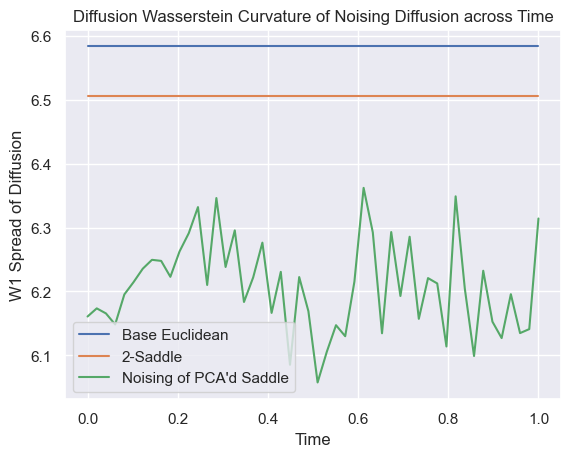

In [ ]:
plt.plot(ts, np.ones_like(uks_at_ts)*plane_entropy, label = "Base Euclidean")
plt.plot(ts, np.ones_like(uks_at_ts)*sphere_entropy, label = "2-Saddle")
plt.plot(ts, uks_at_ts, label = "Noising of PCA'd Saddle")
plt.xlabel("Time")
plt.ylabel("W1 Spread of Diffusion")
plt.title("Diffusion Wasserstein Curvature of Noising Diffusion across Time")
plt.legend()
plt.show()